<a href="https://colab.research.google.com/github/jioooo20/pengolahan-citra-dan-visi-komputer/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **D1. Operasi Citra Sederhana**

In [1]:
from google.colab import drive
drive.mount('/content/drive')

import cv2 as cv
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
from google.colab.patches import cv2_imshow

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Transformasi Linier Brightness**


mengubah tingkat kecerahan citra
--------------------------------
Masukkan nilai kecerahan:12


/tmp/ipython-input-2677764205.py:16: RuntimeWarning: overflow encountered in scalar add
  brightness_img[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)


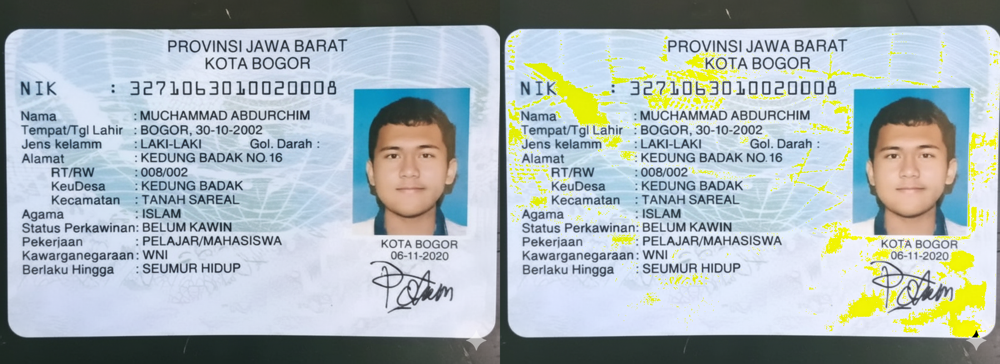

In [2]:
print('mengubah tingkat kecerahan citra')
print('--------------------------------')

try:
  brightness = int(input('Masukkan nilai kecerahan:'))
except ValueError:
  print('Error, NaN')

original = cv.imread('/content/drive/MyDrive/ohim.png')
brightness_img = np.zeros(original.shape, original.dtype)

#akses per piksel
for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      brightness_img[y,x,c] = np.clip(original[y,x,c] + brightness, 0, 255)

#cara siimple tanpa for loop
#brightness_img = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((original, brightness_img))
cv2_imshow(final_frame)

**TUGAS PRAKTIKUM D1**

1. Implementasikan inverse citra pada Google Colaboratory menggunakan formula yang
terdapat pada bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

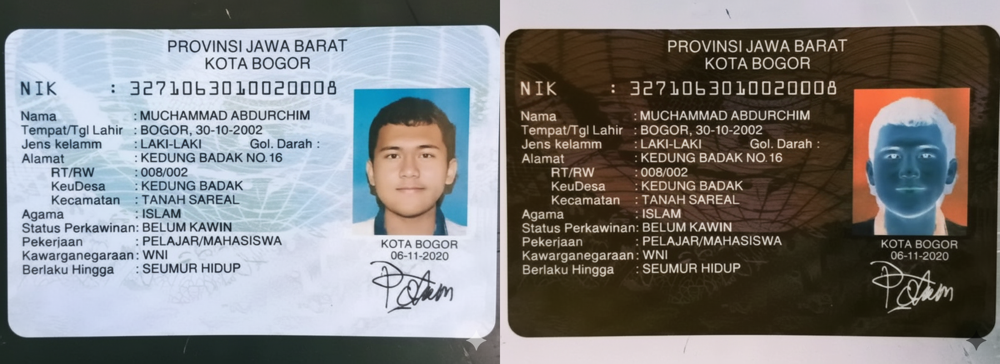

In [3]:
invers_img = original.copy()
invers_img = 255 - invers_img

frame_invers = cv.hconcat((original, invers_img))
cv2_imshow(frame_invers)


2. Implementasikan transformasi contrast pada Google Colaboratory menggunakan
formula yang terdapat pada bagian Ulasan Teori untuk kontras, sehingga
menghasilkan keluaran seperti berikut:

Masukkan nilai kecerahan[-255 - 255]:10
Masukkan kontras[1.0 - 3.0]:1.1


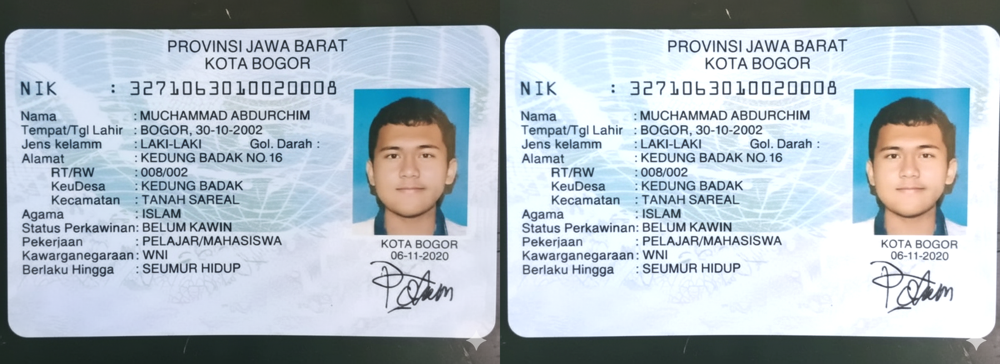

In [4]:
kontras_img = original.copy()
try:
  bright = int(input('Masukkan nilai kecerahan[-255 - 255]:'))
  kontrs = float(input('Masukkan kontras[1.0 - 3.0]:'))
except ValueError:
  print('Error, NaN')

for y in range(original.shape[0]):
  for x in range(original.shape[1]):
    for c in range(original.shape[2]):
      kontras_img[y,x,c] = np.clip(kontrs * original[y,x,c] + bright, 0, 255)

frame_kontras = cv.hconcat((original, kontras_img))
cv2_imshow(frame_kontras)

3. Implementasikan transformasi logarithmic brightness pada Google Colaboratory
menggunakan formula yang terdapat pada bagian Ulasan Teori untuk transformasi
log, sehingga menghasilkan keluaran seperti berikut:

mengubah tingkat kecerahan logaritmic log
--------------------------------
Masukkan nilai kecerahan:40


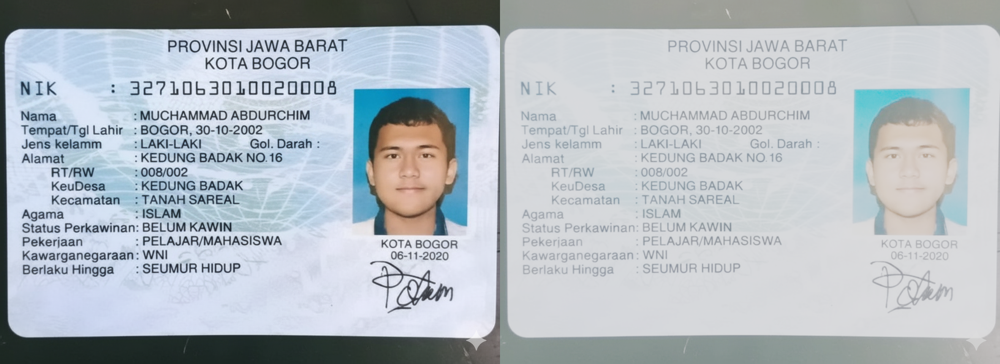

In [5]:
print('mengubah tingkat kecerahan logaritmic log')
print('--------------------------------')

try:
  brightnes = int(input('Masukkan nilai kecerahan:'))
except ValueError:
  print('Error, NaN')

brightnes_img = np.zeros(original.shape, original.dtype)

# transformasi logaritmik
c = brightnes
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for ch in range(original.shape[2]):
            r = original[y, x, ch]
            s = c * np.log(1 + r)   # rumus logaritmik
            brightnes_img[y, x, ch] = np.clip(s, 0, 255)


final_cerah_log = cv.hconcat((original, brightnes_img))
cv2_imshow(final_cerah_log)

4. Implementasikan transformasi grayscale menggunakan metode averaging, lightness,
dan luminance pada Google Colaboratory menggunakan formula yang terdapat pada
bagian Ulasan Teori, sehingga menghasilkan keluaran seperti berikut:

a. Averaging

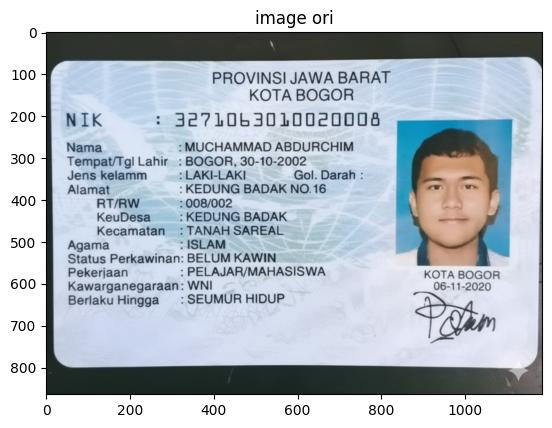

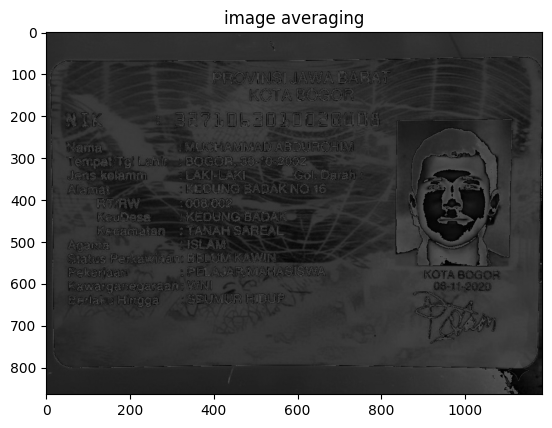

In [6]:
copyori = cv.cvtColor(original, cv.COLOR_BGR2RGB)
avg_img = copyori.copy()
array_img = np.asarray(avg_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_avg = (r + g + b) / 3
avg_img[:, :, 0] = gray_avg
avg_img[:, :, 1] = gray_avg
avg_img[:, :, 2] = gray_avg


# frame_avg = cv.hconcat((original, avg_img))
# cv2_imshow(frame_avg)
plt.imshow(copyori)
plt.title('image ori')
plt.show()
plt.imshow(avg_img)
plt.title('image averaging')
plt.show()


b. Lightness


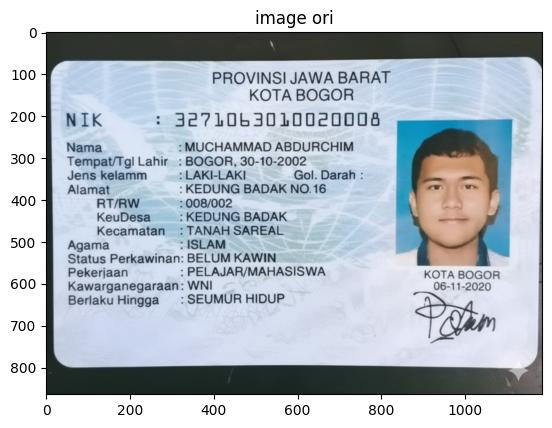

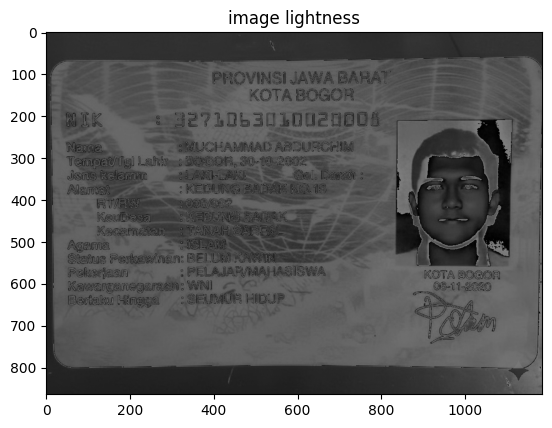

In [7]:
copyori = cv.cvtColor(original, cv.COLOR_BGR2RGB)
lightness_img = copyori.copy()
array_img = np.asarray(lightness_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

# gray_lightness = (array_img.max() + array_img.min())/2
gray_lightness = ((array_img.max(axis=2) + array_img.min(axis=2)) / 2)

lightness_img[:, :, 0] = gray_lightness
lightness_img[:, :, 1] = gray_lightness
lightness_img[:, :, 2] = gray_lightness


plt.imshow(copyori)
plt.title('image ori')
plt.show()
plt.imshow(lightness_img)
plt.title('image lightness')
plt.show()


c. Luminance

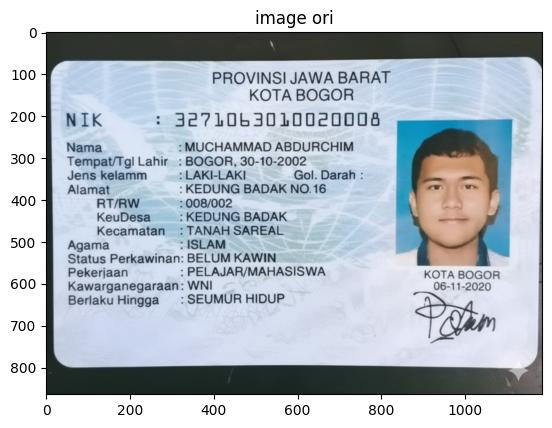

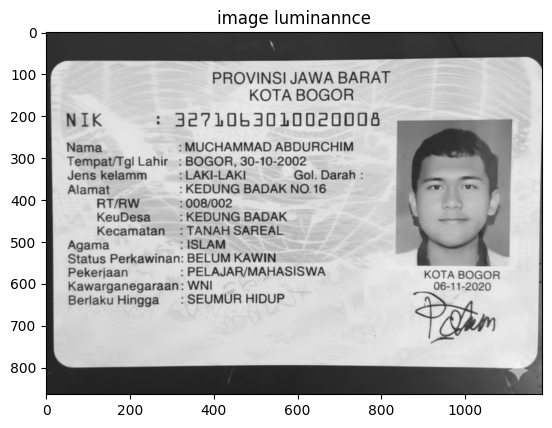

In [8]:
lumi_img = copyori.copy()
array_img = np.asarray(lumi_img)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_lumi = (0.21*r) + (0.72*g) + (0.07*b)

lumi_img[:, :, 0] = gray_lumi
lumi_img[:, :, 1] = gray_lumi
lumi_img[:, :, 2] = gray_lumi


plt.imshow(copyori)
plt.title('image ori')
plt.show()
plt.imshow(lumi_img)
plt.title('image luminannce')
plt.show()


5. Tampilkanlah warna tertentu pada citra, dan ubah warna lain menjadi grayscale. Misal,
tampilkan warna biru pada citra masukan dan ubah bagian lain yang tidak berwarna
biru menjadi grayscale seperti pada contoh berikut:

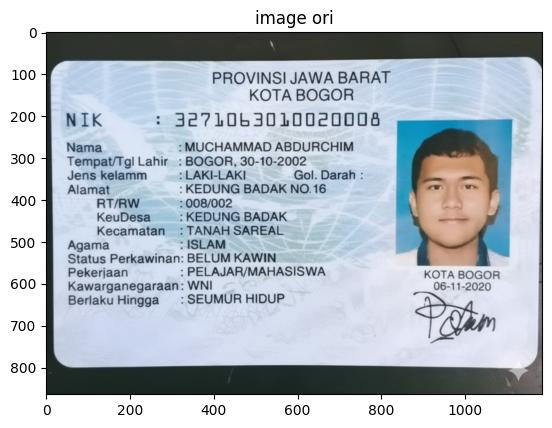

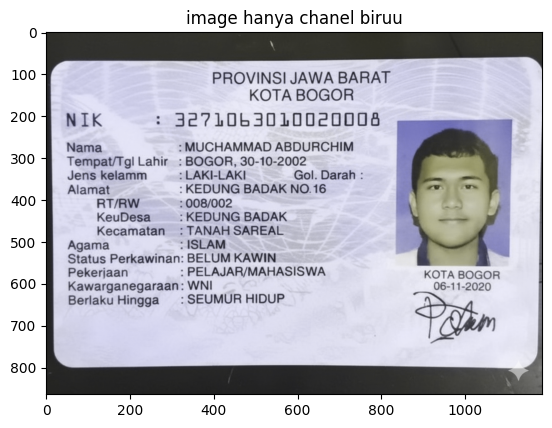

In [9]:
bnyala = copyori.copy()
array_img = np.asarray(bnyala)
r = array_img[:, :, 0]
g = array_img[:, :, 1]
b = array_img[:, :, 2]

gray_lumi = (0.21*r) + (0.72*g) + (0.07*b)

bnyala[:, :, 0] = gray_lumi
bnyala[:, :, 1] = gray_lumi
# bnyala[:, :, 2] = gray_lumi


plt.imshow(copyori)
plt.title('image ori')
plt.show()
plt.imshow(bnyala)
plt.title('image hanya chanel biruu')
plt.show()


D2. Operasi Aritmatika dan Logika

1. Buat Gamma Correction sesuai dengan petunjuk berikut.

    Percobaan ini akan meminta anda membuat Gamma Correction. Pada percobaan ini, nilai Gamma akan diset dengan meminta masukan dari pengguna. Berikut adalah kode untuk meminta masukan nilai dari pengguna. Lanjutkan kode tersebut dengan membuat image dengan gamma correction sesuai rumus yang telah diberikan.

 Gamma Correction pada citra 
----------------------------------
Masukkan nilai Gamma: 1.5


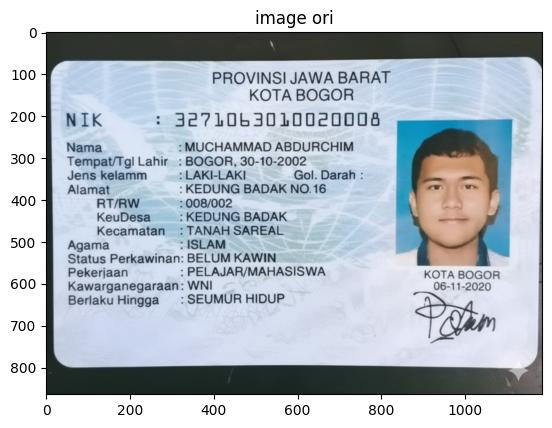

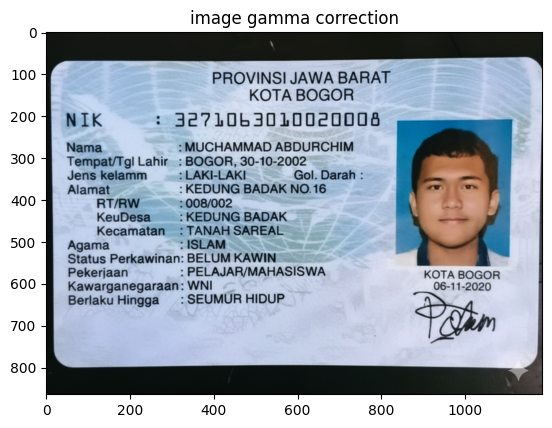

In [10]:
print(' Gamma Correction pada citra ')
print('----------------------------------')
try:
  gamma = float(input('Masukkan nilai Gamma: ')) # Changed to float for potential fractional gamma values
except ValueError:
  print('Error, not a number')

gamma_img = copyori.copy()
gamma_corrected = np.zeros(copyori.shape, copyori.dtype)

# Apply gamma correction
for y in range(copyori.shape[0]):
    for x in range(copyori.shape[1]):
        for c in range(copyori.shape[2]):
            # Normalize pixel values to the range [0, 1]
            normalized_pixel = copyori[y, x, c] / 255.0
            # Apply gamma correction formula
            corrected_pixel = np.power(normalized_pixel, gamma)
            # Scale back to the range [0, 255]
            gamma_corrected[y, x, c] = np.clip(corrected_pixel * 255.0, 0, 255)

plt.imshow(copyori)
plt.title('image ori')
plt.show()
plt.imshow(gamma_corrected)
plt.title('image gamma correction')
plt.show()

**2. Buat Simulasi Image Depth**

Percobaan ini digunakan sebagai simulasi dari proses kuantisasi citra. Pada kuantisasi
citra, pixel dapat direpresentasikan dengan n-bit kedalaman (default menggunakan 8-bit).
Pada pixel 8-bit, warna yang memungkinkan adalah 256 warna, dari 0 (0000 0000) hingga
255(1111 1111). Pada pixel 7-bit, warna yang memungkinkan adalah 128 warna, dari 0
(000 0000) hingga 127 (111 1111). Kemungkinan warna didapat dari pangkat 2 jumlah bit.
Jika 7bit, maka jumlah warnanya adalah 27 = 128, dst.

Berikut adalah kode untuk membaca citra masukan dan memberi nilai kedalaman citra,
silahkan lanjutkan kode program berikut sehingga menghasilkan keluaran seperti contoh
pada Gambar.

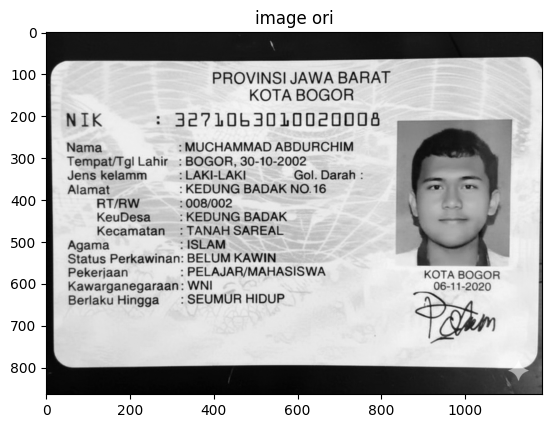

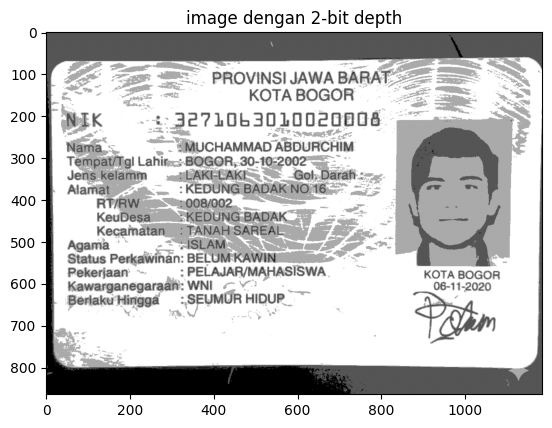

In [11]:
bit_depth = 2
level = 255 / (pow(2,bit_depth)-1)
origelap = cv.cvtColor(copyori, cv.COLOR_BGR2GRAY)

#rumus
quantized_img = np.round(origelap / level) * level

plt.imshow(origelap, cmap='gray')
plt.title('image ori')
plt.show()
plt.imshow(quantized_img, cmap='gray')
plt.title(f'image dengan {bit_depth}-bit depth')
plt.show()

3. Buat modul Average Denoising
Buat modul average denoising sesuai dengan rumus yang telah diberikan pada sub bab
sebelumnya.
Citra asli sudah disediakan pada /images/galaxy.jpg.
100 Citra dengan Gaussian Noise sudah disediakan pada /images/noises/*.jpg
Anda dapat menggunakan code berikut untuk membaca semua image dalam satu folder ,
gunakan modul glob (import glob).

In [12]:
import glob
import cv2 as cv
import numpy as np
from math import log10, sqrt

cv_ori = cv.imread('/content/drive/MyDrive/citrapcvk/galaxy.jpg')

cv_img = []
for img_path in glob.glob('/content/drive/MyDrive/citrapcvk/noises/*.jpg'):
    n = cv.imread(img_path)
    cv_img.append(n)

def PSNR(ori,compress):
  mse = np.mean((ori-compress)**2)
  if mse == 0:
    return 100
  max_piksel = 255.0
  psnr = 20 * log10(max_piksel / sqrt(mse))
  return psnr

def main():
  nilai_psnr = []

  for img in cv_img:
    nilai = PSNR(cv_ori, img)
    nilai_psnr.append(nilai)

  for n in [10, 20, 40, 80, 100]:
    avg = np.mean(nilai_psnr[:n])
    print(f"Rata-rata PSNR {n} gambar = {avg:.2f} dB")


if __name__ == "__main__":
    main()



Rata-rata PSNR 10 gambar = 27.89 dB
Rata-rata PSNR 20 gambar = 27.88 dB
Rata-rata PSNR 40 gambar = 27.88 dB
Rata-rata PSNR 80 gambar = 27.88 dB
Rata-rata PSNR 100 gambar = 27.88 dB


**4. Buat image masking**

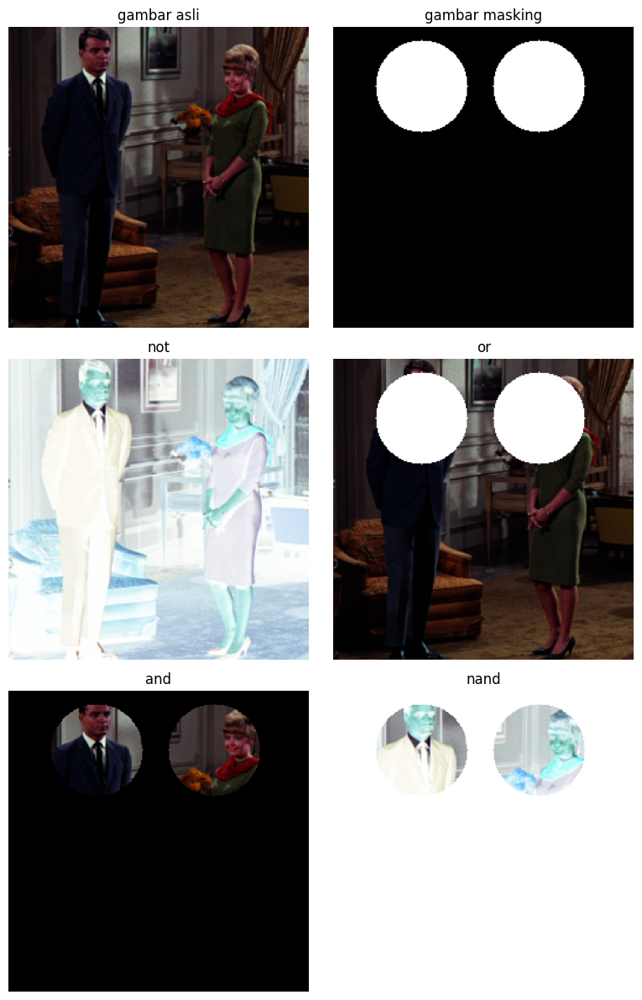

In [41]:
kopel = cv.cvtColor(cv.imread('/content/drive/MyDrive/citrapcvk/couple.tiff'),cv.COLOR_BGR2RGB)
bgputih = cv.cvtColor(np.zeros(kopel.shape, kopel.dtype), cv.COLOR_BGR2RGB)

#bulet
cv.circle(bgputih, center=(75,50), radius=39, color=(255,255,255), thickness=cv.FILLED)
cv.circle(bgputih, center=(175,50), radius=39, color=(255,255,255), thickness=cv.FILLED)

#logika
imgnot = cv.bitwise_not(kopel)
imgor = cv.bitwise_or(kopel, bgputih)
imgand = cv.bitwise_and(kopel, bgputih)
imgnand = cv.bitwise_not(cv.bitwise_and(kopel, bgputih))
imgxor = cv.bitwise_xor(kopel, bgputih)

title = ['gambar asli', 'gambar masking', 'not','or','and', 'nand', 'xor']
img = [kopel, bgputih, imgnot, imgor, imgand, imgnand, imgxor]

plt.figure(figsize=(8,12))
for i in range(6):
    plt.subplot(3,2,i+1)
    plt.imshow(img[i])
    plt.title(title[i])
    plt.axis('off')
plt.tight_layout()
plt.show()